In [1]:
import numpy as np
import cv2 as cv
from scipy . optimize import minimize
from scipy import linalg
import matplotlib . pyplot as plt

In [67]:
import numpy as np
import cv2 as cv
from scipy . optimize import minimize
from scipy import linalg
import matplotlib . pyplot as plt

#np . random . seed ( 0 )
N = 100
half_n = N// 2
r = 10
s = r /16
t = np.random.uniform (0 , 2*np.pi , half_n )
n = s * np.random.randn( half_n )
x , y = (r + n)*np.cos(t) , (r + n)*np.sin(t)
X_circ = np.hstack(( x.reshape(half_n , 1 ) , y.reshape (half_n , 1 )))
m, b = -1, 2
x = np.linspace (-12, 12 , half_n )
y = m*x + b + s*np.random.randn( half_n )
X_line = np.hstack(( x.reshape ( half_n , 1 ) , y.reshape ( half_n , 1 ) ) )
X = np.vstack ( ( X_line ,X_circ  ) )


#plt.figure(figsize=(16,16))
#for point in X:
#    plt.scatter(point[0],point[1])
#    plt.axis("equal")
#plt.show()

RANSAC for a Straight Line

C:\Users\Shyamal\AppData\Local\Temp\ipykernel_11676\3776084300.py:22: RuntimeWarning: invalid value encountered in double_scalars
  distance = abs((a*X[i][0] + b*X[i][1] + c)/ (np.sqrt(a**2 + b**2)) )


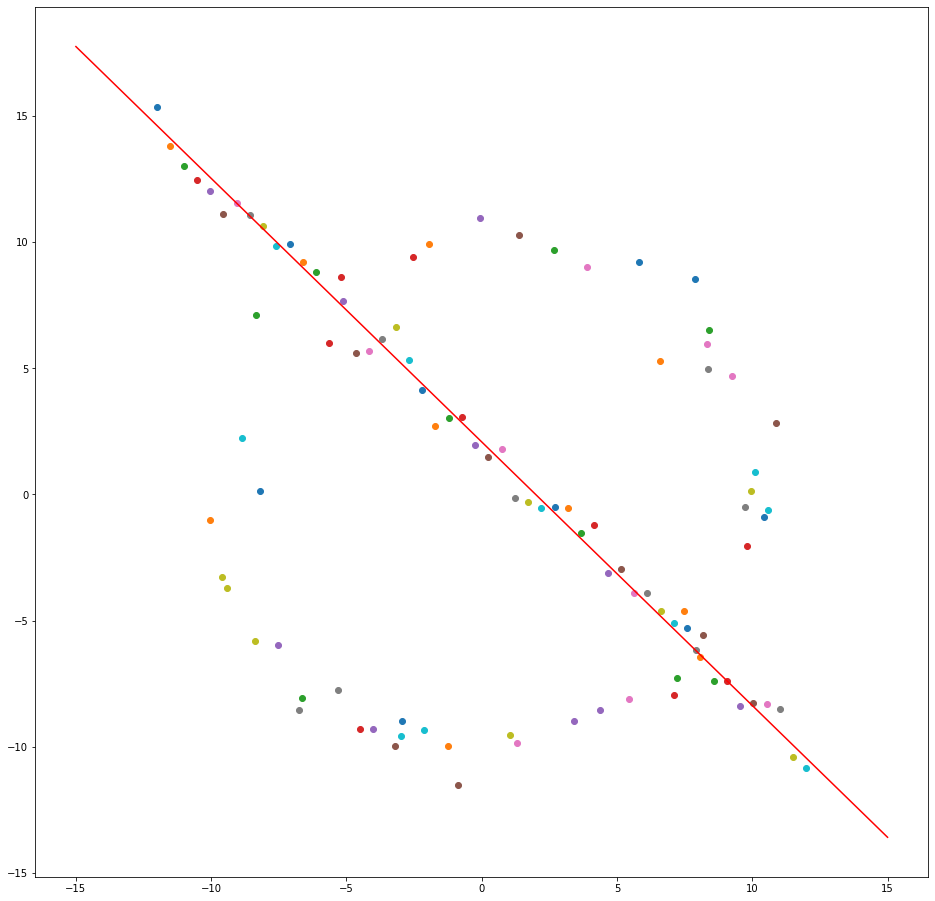

Number of Samples = 600
Inlinear Count = 53


In [68]:
import random

s = 2
t = 1
e = 0.3
p = 0.99
N = int (np.log(1-p) / np.log(1 - (1-e)**s)) * 100

max_inlinear_count = 0
coefficients = []

for sample in range(0 , N+1):
    dot1 , dot2 = random.randint(0,len(X)-1), random.randint(0,len(X)-1)
    # equation of a line passing the 2 points ; (y1-y2).X + (x2-x1).Y + (x1.y2 - y1.x2) = 0 
    a = X[dot1][1] - X[dot2][1]
    b = X[dot2][0] - X[dot1][0]
    c = X[dot1][0]*X[dot2][1]  - X[dot1][1]*X[dot2][0]

    # find the count of the points lying withing the threshold (t)
    inlinears_count = 0
    for  i in range(0 , len(X)):
        distance = abs((a*X[i][0] + b*X[i][1] + c)/ (np.sqrt(a**2 + b**2)) )
        if distance < t:
            inlinears_count += 1

    if inlinears_count > max_inlinear_count:
        max_inlinear_count = inlinears_count
        coefficients = [ a, b, c]

plt.figure(figsize=(16,16))
for point in X:
    plt.scatter(point[0],point[1])

A , B , C = coefficients[0] , coefficients[1] , coefficients[2]
x_values = np.arange(-15,15+1)
y_values = -1*(x_values*A +C)/B

plt.plot(x_values, y_values , color="red")
plt.show()
print("Number of Samples =",N)
print("Inlinear Count =",max_inlinear_count)

## RANSAC for a Circle

Function to generate a circle from three points

In [51]:
import random

def Circle_from3points(All_points ,Number_of_itaration ,tresh):
    max_inlinear_count = 0
    for sample in range(0 , Number_of_itaration+1):
        dot1 , dot2 , dot3 = random.randint(0,len(All_points)-1), random.randint(0,len(All_points)-1) , random.randint(0,len(All_points)-1)
        x1,x2,x3 = All_points[dot1][0] , All_points[dot2][0] , All_points[dot3][0]
        y1,y2,y3 = All_points[dot1][1] , All_points[dot2][1] , All_points[dot3][1]

        P = np.array([[2*x1 , 2*y1 , 1] , [2*x2 , 2*y2 , 1] , [2*x3 , 2*y3 , 1]])
        if (np.linalg.det(P)==0): continue
        K = np.array([[x1**2 +y1**2] , [x2**2 +y2**2] , [x3**2 +y3**2]])*(-1)
        answ = np.linalg.inv(P) @ K
        g , f , c = answ[0][0] , answ[1][0] , answ[2][0]
        radius = np.sqrt(g**2 + f**2 -c)
        if (radius>10): continue
        center = [-g , -f]

        inlinears_count = 0
        for  i in range(0 , len(All_points)):
            distance = abs(np.sqrt((All_points[i][0]-center[0])**2 + (All_points[i][1]-center[1])**2) - radius)
            if distance < tresh:
                inlinears_count += 1
        if inlinears_count > max_inlinear_count:
            max_inlinear_count = inlinears_count
            coefficients =  [f, g, c]
            best_Sample_points = np.array([All_points[dot1],All_points[dot2],All_points[dot3]])
    
    return(coefficients,best_Sample_points,max_inlinear_count)
        


RANSAC Estiomation of a cicle

In [120]:
s = 3
t = 1
e = 0.5
p = 0.99
N = int (np.log(1-p) / np.log(1 - (1-e)**s)) 

ran_coeff , ransac_sample , ransac_inlinear_count = Circle_from3points(X,N,t)
F, G ,C = ran_coeff[0] , ran_coeff[1] , ran_coeff[2]
R = np.sqrt(G**2 + F**2 -C)

# Finding Inlenears and Outlinears of the RANSAC Estimated Circle
In,Out = [] ,[]
for point in X:
    d = abs(np.sqrt((point[0]+G)**2 + (point[1]+F)**2) - R)
    if d < t:
        In.append(point)
    else:
        Out.append(point)

Inlin = np.array(In).T
Outlin = np.array(Out).T
Samp = ransac_sample.T

print("Number of Itarations =",N)
print("RANSAC Estimated circle Inlinear Count =",ransac_inlinear_count)



Number of Itarations = 34
RANSAC Estimated circle Inlinear Count = 40


Finding the best fitting circle

In [65]:

best_fitting_coeff , best_selected_pionts , best_inlinear_count = Circle_from3points(X,10000,t)
best_F, best_G ,best_C = best_fitting_coeff[0] , best_fitting_coeff[1] , best_fitting_coeff[2]
best_R = np.sqrt(best_G**2 + best_F**2 -best_C)

b_samp = best_selected_pionts.T

print("best fitting circle Inlinear Count =",best_inlinear_count)

best fitting circle Inlinear Count = 52


Plotting the above Results

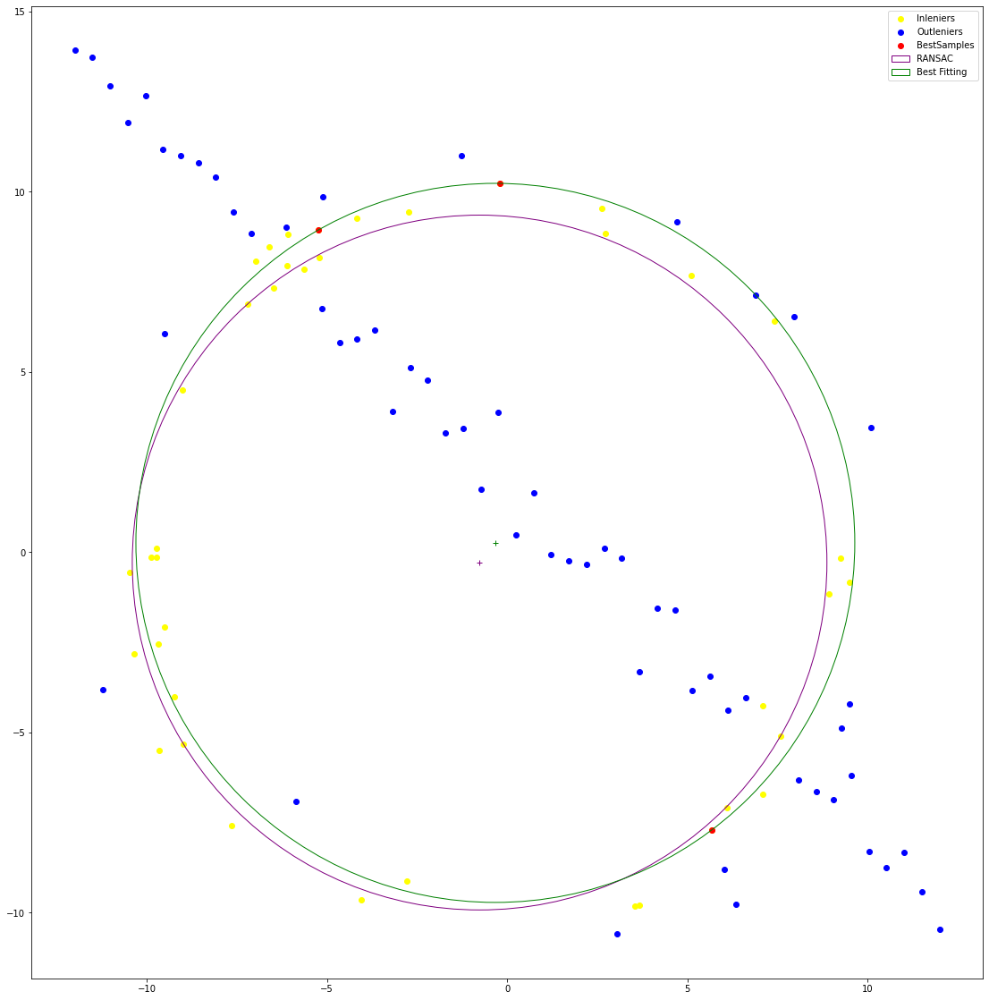

In [121]:
#plotting
figure, axes = plt.subplots( 1, figsize=(20,20) )

ransac_circle = plt.Circle((-G,-F), R, fill=False, color="purple" ,label="RANSAC")
best_fitting_circle = plt.Circle((-best_G,-best_F), best_R, fill=False, color="green" ,label="Best Fitting")

axes.scatter(Inlin[0],Inlin[1], color="yellow" , label="Inleniers")
axes.scatter(Outlin[0],Outlin[1], color="blue" , label="Outleniers")
axes.scatter(b_samp[0] ,b_samp[1], color="red" , label="BestSamples")
axes.plot(-G,-F,"+",color="purple")
axes.plot(-best_G,-best_F,"+",color="green")
axes.set_aspect( 1 )
axes.add_artist( ransac_circle )
axes.add_artist( best_fitting_circle )
plt.legend(loc ="upper right")
plt.show()



### Question 02
## Homography

(-0.5, 1023.5, 767.5, -0.5)

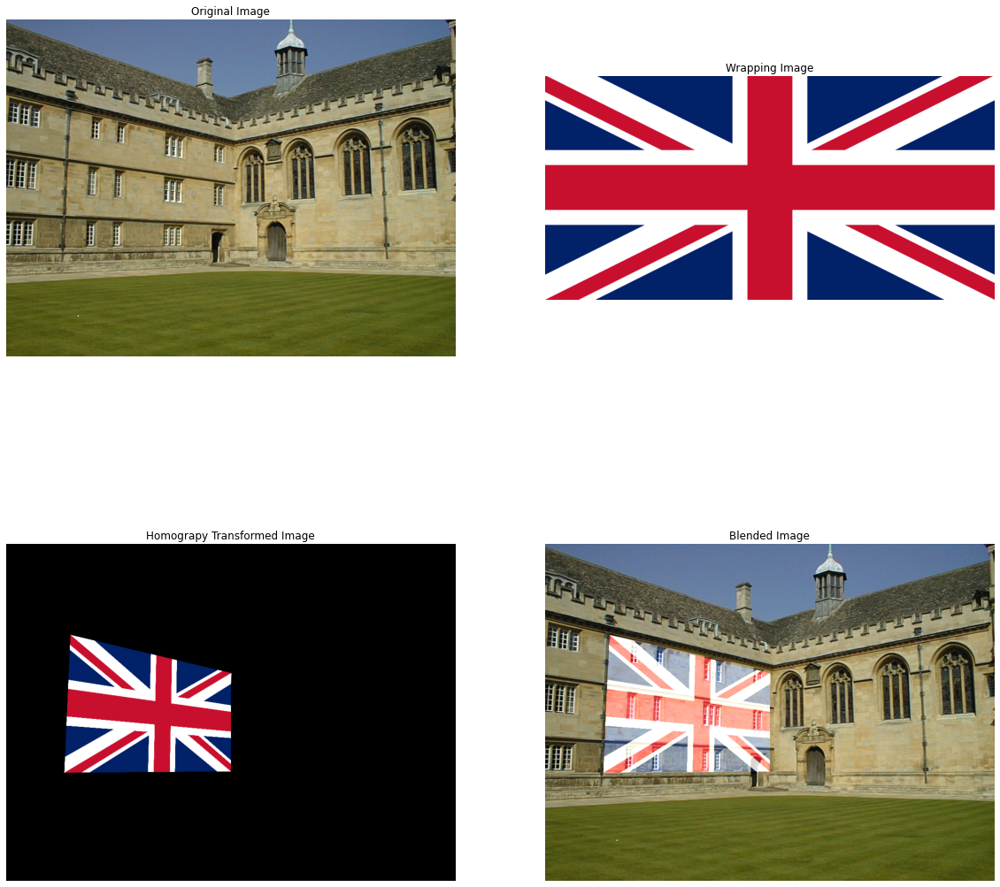

In [31]:
import numpy as np
import cv2 as cv

def MouseHandling(event,x,y,f,pram):
    global im_temp,pts_src
    if event== cv.EVENT_LBUTTONDOWN:
        cv.circle(im_temp ,(x,y),3,(0,255,255),5,cv.LINE_AA)
        cv.imshow("Image",im_temp)
        if len(pts_src)<4:
            pts_src = np.append(pts_src,[(x,y)],axis=0)

architecture_img = cv.imread("001.jpg")
flag = cv.imread("Flag_of_the_United_Kingdom.svg.png")

height , width = architecture_img.shape[0] , architecture_img.shape[1]
f_width,f_height = flag.shape[1] , flag.shape[0]

pts_dst = np.array([[0,0] , [f_width-1,0] , [f_width-1,f_height-1] , [0,f_height-1] ])

cv.namedWindow("Image",1)

ppp = cv.cvtColor(architecture_img, cv.COLOR_BGR2RGB)
im_temp = cv.cvtColor(ppp, cv.COLOR_RGB2BGR)
pts_src = np.empty((0,2))

cv.setMouseCallback("Image", MouseHandling)

cv.imshow("Image",im_temp)
cv.waitKey(0)

Homograpy_Matrix , status = cv.findHomography(pts_src, pts_dst)

transformed_flag = cv.warpPerspective(flag, np.linalg.inv(Homograpy_Matrix), (width, height))

blend_image = cv.addWeighted(architecture_img, 1, transformed_flag, 0.8, 0)

cv.imshow("Image",blend_image)
cv.waitKey(0)

figure, axes = plt.subplots( 2,2, figsize=(20,20) )
axes[0,0].imshow(cv.cvtColor(architecture_img,cv.COLOR_BGR2RGB))
axes[0,0].set_title("Original Image")
axes[0,0].axis("off")
axes[0,1].imshow(cv.cvtColor(flag,cv.COLOR_BGR2RGB))
axes[0,1].set_title("Wrapping Image")
axes[0,1].axis("off")
axes[1,0].imshow(cv.cvtColor(transformed_flag,cv.COLOR_BGR2RGB))
axes[1,0].set_title("Homograpy Transformed Image")
axes[1,0].axis("off")
axes[1,1].imshow(cv.cvtColor(blend_image,cv.COLOR_BGR2RGB))
axes[1,1].set_title("Blended Image")
axes[1,1].axis("off")



In [2]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

def MouseHandling(event,x,y,f,pram):
    global im_temp,pts_src
    if event== cv.EVENT_LBUTTONDOWN:
        cv.circle(im_temp ,(x,y),3,(0,255,255),3,cv.LINE_AA)
        cv.imshow("Image",im_temp)
        if len(pts_src)<4:
            pts_src = np.append(pts_src,[(x,y)],axis=0)


def Image_wrapping(src1,src2):
    global im_temp,pts_src
    height , width = src1.shape[0] , src1.shape[1]
    wrp_width,wrp_height = src2.shape[1] , src2.shape[0]

    pts_dst = np.array([[0,0] , [wrp_width-1,0] , [wrp_width-1,wrp_height-1] , [0,wrp_height-1] ])

    cv.namedWindow("Image",1)

    new_temp = cv.cvtColor(src1, cv.COLOR_BGR2RGB)
    im_temp = cv.cvtColor(new_temp, cv.COLOR_RGB2BGR)
    
    
    pts_src = np.empty((0,2))

    cv.setMouseCallback("Image", MouseHandling)

    cv.imshow("Image",im_temp)
    cv.waitKey(0)

    Homograpy_Matrix , status = cv.findHomography(pts_src, pts_dst)
    transformed_wrapper = cv.warpPerspective(src2, np.linalg.inv(Homograpy_Matrix), (width, height))
    blend_image = cv.addWeighted(src1, 1, transformed_wrapper, 0.8, 0)

    cv.imshow("Image",blend_image)
    cv.waitKey(0)

    return(transformed_wrapper,blend_image)    



2 

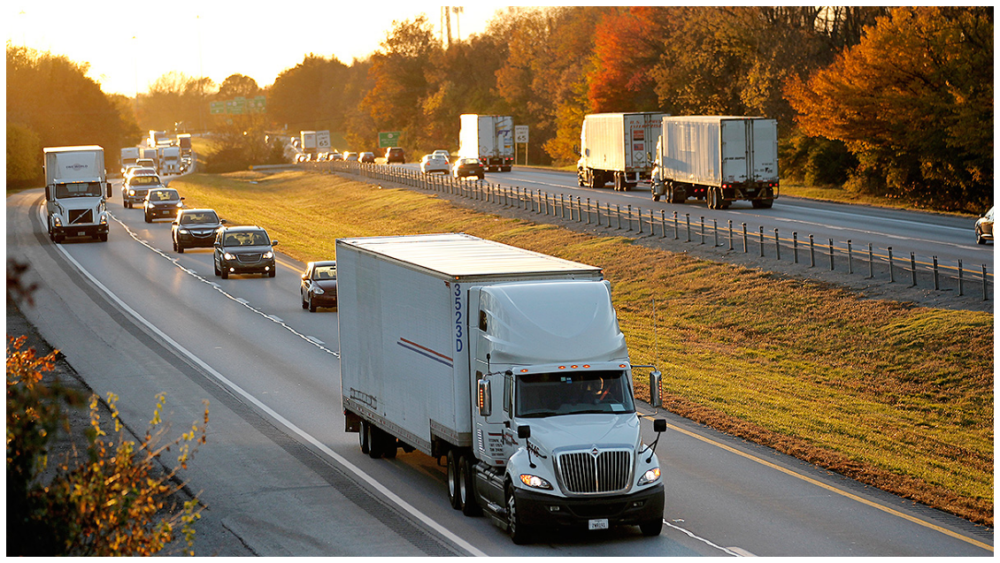

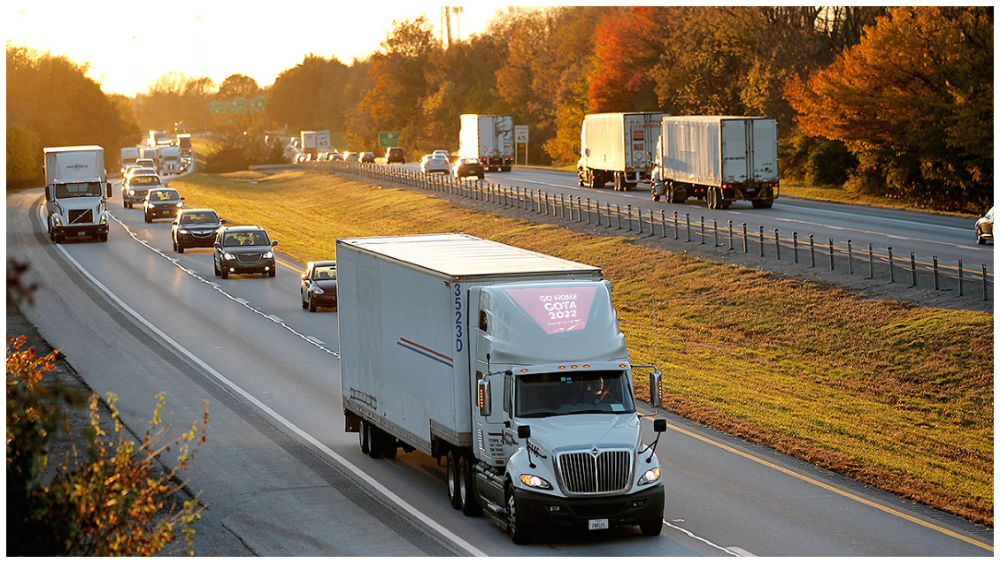

In [7]:
car = cv.imread("tonnage_3.jpg")
sticker = cv.imread("channels4_profile.jpg")

transformed_sticker,belnded_img = Image_wrapping(car,sticker)

plt.figure(figsize=(20,12))
plt.imshow(cv.cvtColor(car,cv.COLOR_BGR2RGB))
plt.axis('off')

plt.figure(figsize=(20,12))
plt.imshow(cv.cvtColor(belnded_img,cv.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

3

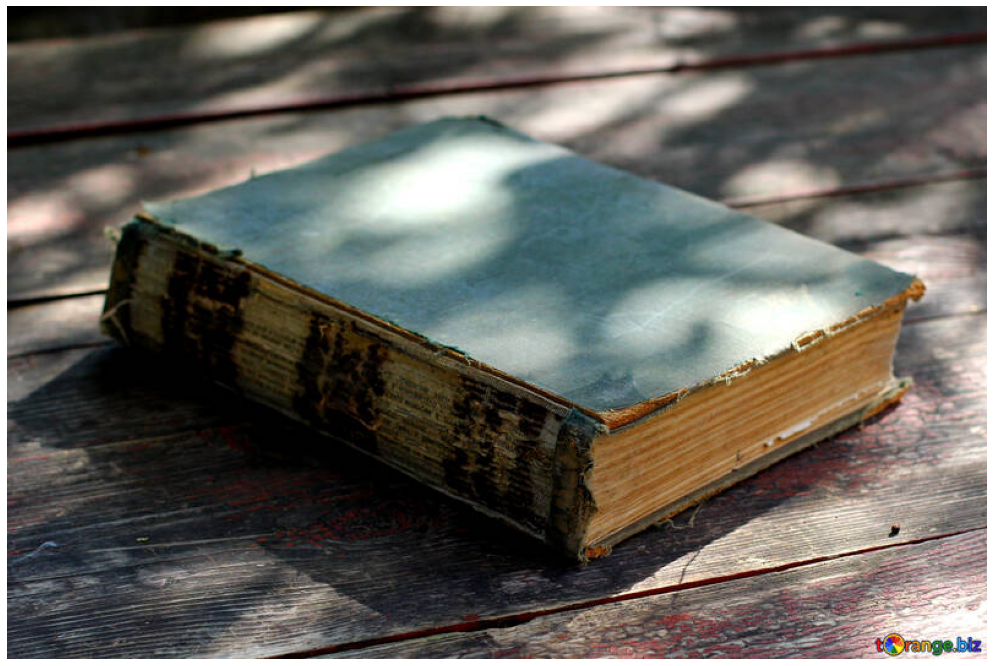

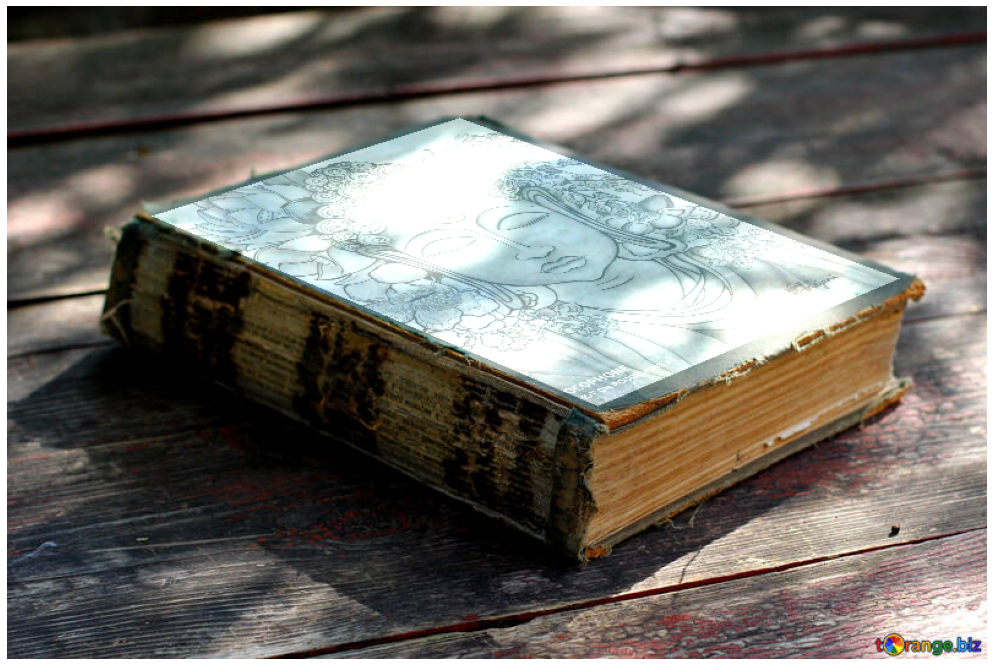

In [8]:
book = cv.imread("book002.jpg")
drawing = cv.imread("WhatsApp Image 2021-05-14 at 01.01.04.jpeg")

transformed_sticker,belnded_img = Image_wrapping(book,drawing)

plt.figure(figsize=(20,12))
plt.imshow(cv.cvtColor(book,cv.COLOR_BGR2RGB))
plt.axis('off')

plt.figure(figsize=(20,12))
plt.imshow(cv.cvtColor(belnded_img,cv.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

### Question 3
## SIFT _ Homography _ RANSAC

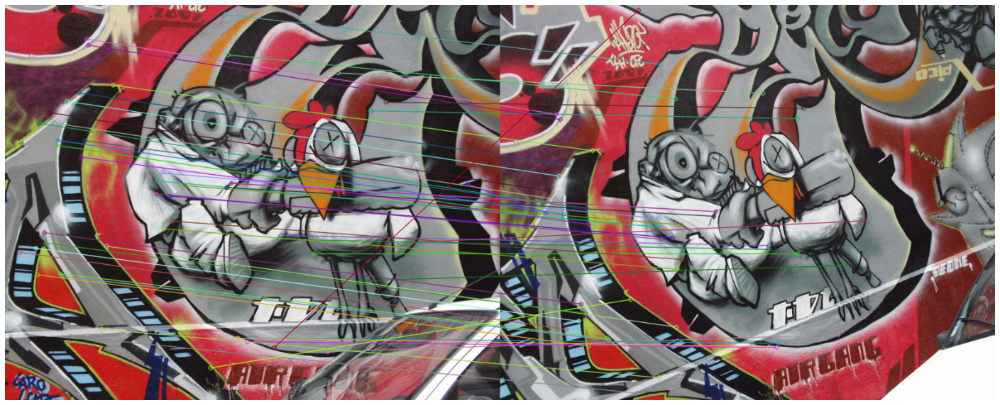

In [98]:
import numpy as np
import cv2 as cv
img1 = cv.imread(r'graf\img1.ppm')
img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
img2 = cv.imread(r'graf\img2.ppm')
img2 = cv.cvtColor(img2, cv.COLOR_BGR2RGB)

sift = cv.SIFT_create()# detect features from the image
keypoints_1, descriptors_1 = sift.detectAndCompute(img1, None) 
keypoints_2, descriptors_2 = sift.detectAndCompute(img2, None) 

# draw the detected key points
bf = cv.BFMatcher(cv.NORM_L1, crossCheck=True)
matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

matched_img = cv.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.figure(figsize=(25,18))
plt.imshow(matched_img)
plt.axis('off')
plt.show()

In [60]:
def sift_keypoint(src,dst):
    sift = cv.SIFT_create()# detect features from the image
    keypoints_1, descriptors_1 = sift.detectAndCompute(src, None) 
    keypoints_2, descriptors_2 = sift.detectAndCompute(dst, None) 

    # draw the detected key points
    bf = cv.BFMatcher(cv.NORM_L1, crossCheck=True)
    matches = bf.match(descriptors_1,descriptors_2)
    matches = sorted(matches, key = lambda x:x.distance)

        # Initialize lists
    list_kp1 = []
    list_kp2 = []

    # For each match...
    for mat in matches:

        # Get the matching keypoints for each of the images
        img1_idx = mat.queryIdx
        img2_idx = mat.trainIdx

        # x - columns
        # y - rows
        # Get the coordinates
        (x1, y1) = keypoints_1[img1_idx].pt
        (x2, y2) = keypoints_2[img2_idx].pt

        # Append to each list
        list_kp1.append((int(x1+0.5), int(y1+0.5)))
        list_kp2.append((int(x2+0.5), int(y2+0.5)))
    return(list_kp1,list_kp2)


import random as rnd

def Homography_by_ransac(src,dst):

    N = 10000
    threshold = 0.3
    max_inlinears = 0
    H=[]
    
    src_keylist , dst_keylist = sift_keypoint(src,dst)
    src_keylist, dst_keylist = np.array(src_keylist) , np.array(dst_keylist)
   

    for samp in range(0,N):
        
        ind1  =rnd.randrange(0,len(src_keylist))
        ind2 = rnd.randrange(0,len(src_keylist))
        ind3 = rnd.randrange(0,len(src_keylist))
        ind4 = rnd.randrange(0,len(src_keylist))

        s_pt1 ,d_pt1 = src_keylist[ind1]  , dst_keylist[ind1]
        s_pt2 ,d_pt2 = src_keylist[ind2]  , dst_keylist[ind2]
        s_pt3 ,d_pt3 = src_keylist[ind3]  , dst_keylist[ind3]
        s_pt4 ,d_pt4 = src_keylist[ind4]  , dst_keylist[ind4]

        colinearity =  bool(np.cross(s_pt1,s_pt2)) and bool(np.cross(s_pt1,s_pt3)) and bool(np.cross(s_pt1,s_pt4))
        colinearity =  colinearity and bool(np.cross(s_pt2,s_pt3)) and bool(np.cross(s_pt2,s_pt4))
        colinearity =  colinearity and bool(np.cross(s_pt3,s_pt4))
        if (not colinearity): continue
        

        A = np.array([[ -s_pt1[0], -s_pt1[1], -1, 0, 0, 0, d_pt1[0]*s_pt1[0], d_pt1[0]*s_pt1[1], d_pt1[0]],
                      [ 0, 0, 0, -s_pt1[0], -s_pt1[1], -1, d_pt1[1]*s_pt1[0], d_pt1[1]*s_pt1[1], d_pt1[1]],

                      [ -s_pt2[0], -s_pt2[1], -1, 0, 0, 0, d_pt2[0]*s_pt2[0], d_pt2[0]*s_pt2[1], d_pt2[0]],
                      [ 0, 0, 0, -s_pt2[0], -s_pt2[1], -1, d_pt2[1]*s_pt2[0], d_pt2[1]*s_pt2[1], d_pt2[1]],

                      [ -s_pt3[0], -s_pt3[1], -1, 0, 0, 0, d_pt3[0]*s_pt3[0], d_pt3[0]*s_pt3[1], d_pt3[0]],
                      [ 0, 0, 0, -s_pt3[0], -s_pt3[1], -1, d_pt3[1]*s_pt3[0], d_pt3[1]*s_pt3[1], d_pt3[1]],

                      [ -s_pt4[0], -s_pt4[1], -1, 0, 0, 0, d_pt4[0]*s_pt4[0], d_pt4[0]*s_pt4[1], d_pt4[0]],
                      [ 0, 0, 0, -s_pt4[0], -s_pt4[1], -1, d_pt4[1]*s_pt4[0], d_pt4[1]*s_pt4[1], d_pt4[1]],
                      [0, 0, 0, 0, 0, 0, 0, 0, 1]])
 
         
        h = np.linalg.inv(A) @ np.array([[0,0,0,0,0,0,0,0,1]]).T
        h = np.reshape(h,(3,3))
        X = np.vstack([src_keylist.T , np.ones( (1, len(src_keylist)) )])

        transformed_keys = h @ X
       
        z= np.array([transformed_keys[-1]]).T
        transformed_keys = (transformed_keys[:2].T) / z

        #RANSAC proceedure 
        inlinears_count = 0
        for  i in range(0 , len(transformed_keys)):
            distance = np.sqrt( (transformed_keys[i][0] - dst_keylist[i][0])**2 + (transformed_keys[i][1] - dst_keylist[i][1])**2 )
            #print(distance)
            if abs(distance) < threshold:
                inlinears_count += 1
        
        if inlinears_count > max_inlinears:
            max_inlinears = inlinears_count
            H = h
    #print(max_inlinears)
    return(H)



In [99]:
H=Homography_by_ransac(img1,img2)
print(H)

118
[[ 8.77942755e-01  3.08399640e-01 -3.82204197e+01]
 [-1.83534856e-01  9.34982025e-01  1.53297129e+02]
 [ 1.98722744e-04 -2.40915196e-05  1.00000000e+00]]


In [72]:
Given_Homography = np.array([[8.7976964e-01 ,  3.1245438e-01 , -3.9430589e+01],
                              [-1.8389418e-01,   9.3847198e-01 ,  1.5315784e+02],
                              [1.9641425e-04 , -1.6015275e-05  , 1.0000000e+00]])

Given_Homography = np.linalg.inv(Given_Homography)
print("Given homography matrix is")
print(Given_Homography)


Given homography matrix is
[[ 1.04337705e+00 -3.45775593e-01  9.40992147e+01]
 [ 2.37275311e-01  9.84151000e-01 -1.41374536e+02]
 [-2.01134092e-04  8.36767027e-05  9.79253421e-01]]


In [78]:
print("difference")
print(H-Given_Homography)
print(np.max(H-Given_Homography))

difference
[[ 2.65713477e-02 -1.15879740e-02  3.10655501e+00]
 [ 1.22744989e-02  1.63701340e-02 -3.19624245e+00]
 [ 1.12282269e-05 -7.62952768e-06  2.07465788e-02]]
3.10655501012063


In [101]:
wrapped_img2 = cv.warpPerspective(img1, H , (1000,1000))

#fgh = cv.addWeighted(img2,1,wrapped_img2,0.8,0)
figure, axes = plt.subplots( 1,3, figsize=(25,15) )

axes[0].imshow(img1)
axes[1].imshow(img2)
axes[2].imshow(wrapped_img2)

error: OpenCV(4.5.5) D:\a\opencv-python\opencv-python\opencv\modules\core\src\arithm.cpp:650: error: (-209:Sizes of input arguments do not match) The operation is neither 'array op array' (where arrays have the same size and the same number of channels), nor 'array op scalar', nor 'scalar op array' in function 'cv::arithm_op'


In [44]:
import random
random.randrange(0,10)
b=[2,3]
a =[10,15]
print((np.cross(a,b)))

0


In [18]:
k=np.array([[2,3],[3,2],[3,6]])
noo = np.array([[10,20,30]]).T


In [21]:
np.vstack([k.T , np.ones( (1, len(k)) )])

array([[2., 3., 3.],
       [3., 2., 6.],
       [1., 1., 1.]])

In [309]:
l=7
print(-l)

-7


In [ ]:
np.linalg.eig()